# import

In [2]:
import numpy as np
import pandas as pd

In [3]:
import arff

In [4]:
from sklearn.impute import SimpleImputer

In [5]:
import seaborn as sns; sns.set(style="white")
import matplotlib.pyplot as plt

In [6]:
from scipy.stats import variation

In [7]:
from sklearn.linear_model import LinearRegression

In [8]:
import warnings

# 1. The LASSO and Boosting for Regression

## (a) Training set and test set

In [8]:
# import data with feature names
data = arff.load(open('./1The LASSO and Boosting for Regression/communities.arff'))

attributes = []
for i in data['attributes']:
    attributes.append(i[0])

communities_data = pd.DataFrame(data = data['data'], columns = attributes)
# drop non-predictive features
communities_data = communities_data[attributes[5:]]


In [9]:
# split the data into training set and test set

# training set
communities_train = communities_data.iloc[:1495]

# test set
communities_test = communities_data.iloc[1495:]

## (b) Data imputation on predictive features

In [10]:
imp = SimpleImputer(missing_values=np.nan, strategy='median')
imp.fit(communities_train)

communities_data_inputed = pd.DataFrame(data = imp.transform(communities_data), columns = attributes[5:])
communities_data_inputed
communities_train_inputed = communities_data_inputed.iloc[:1495]
communities_test_inputed = communities_data_inputed.iloc[1495:]

## (c) A correlation matrix

In [11]:
# extract X datasets and Y datasets
# X
features = attributes[5:-1]
communities_X = communities_data_inputed[features]
communities_train_X = communities_train_inputed[features]
communities_test_X = communities_test_inputed[features]

# Y
label = attributes[-1]
communities_Y = communities_data_inputed[label]
communities_train_Y = communities_train_inputed[label]
communities_test_Y = communities_test_inputed[label]


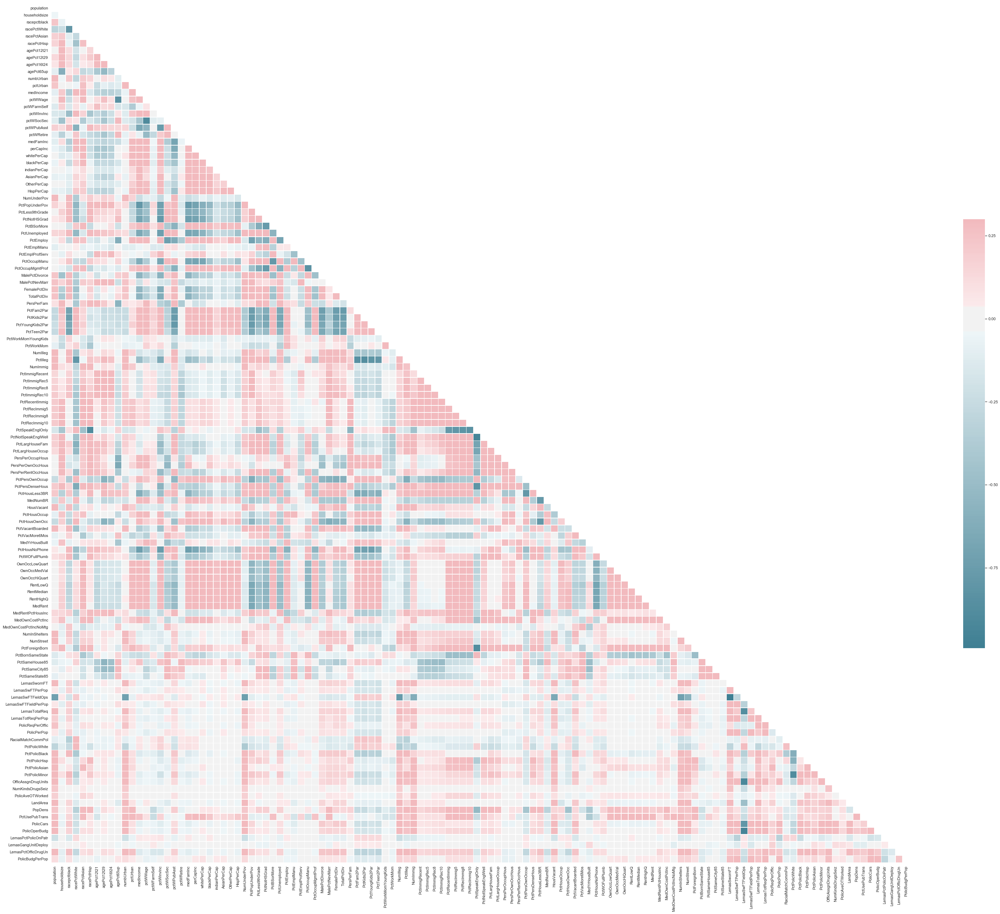

In [12]:
# Compute the correlation matrix
corr = communities_X.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(55, 45))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [13]:
corr.style.background_gradient()

## (d) Coefficient of Variation CV

In [14]:
CV = variation(communities_X).tolist()
for i, j in zip(attributes[5:], CV):
        print('The Coefficient of Variation (CV) for', i, 'is', j, '.')


The Coefficient of Variation (CV) for population is 2.20294993386533 .
The Coefficient of Variation (CV) for householdsize is 0.3532097004119048 .
The Coefficient of Variation (CV) for racepctblack is 1.4105665605340265 .
The Coefficient of Variation (CV) for racePctWhite is 0.3237003633601353 .
The Coefficient of Variation (CV) for racePctAsian is 1.3588213380942629 .
The Coefficient of Variation (CV) for racePctHisp is 1.6138729571484036 .
The Coefficient of Variation (CV) for agePct12t21 is 0.36574812216270847 .
The Coefficient of Variation (CV) for agePct12t29 is 0.2906199873800477 .
The Coefficient of Variation (CV) for agePct16t24 is 0.4950363361780536 .
The Coefficient of Variation (CV) for agePct65up is 0.4233355166105009 .
The Coefficient of Variation (CV) for numbUrban is 2.0012416335137146 .
The Coefficient of Variation (CV) for pctUrban is 0.6386886583257786 .
The Coefficient of Variation (CV) for medIncome is 0.5796080008727312 .
The Coefficient of Variation (CV) for pctWW

## (e) Features with highest CV 

In [15]:
# create CV dataframe
CV = pd.DataFrame(data = CV, columns = ['CV'], index = attributes[5:-1])
# sort CVs from highest to lowest
CV_sort = CV.sort_values(by = 'CV', ascending=False)
# pick top sqrt(128) features
CV_highest = CV_sort[0:int(round(np.sqrt(128)))]
CV_highest

,CV
PctPolicAsian,5.446469
NumStreet,4.406597
NumInShelters,3.484607
NumIlleg,2.993446
NumImmig,2.899770
LemasPctOfficDrugUn,2.554625
NumUnderPov,2.304392
population,2.202950
LemasSwornFT,2.080190
numbUrban,2.001242


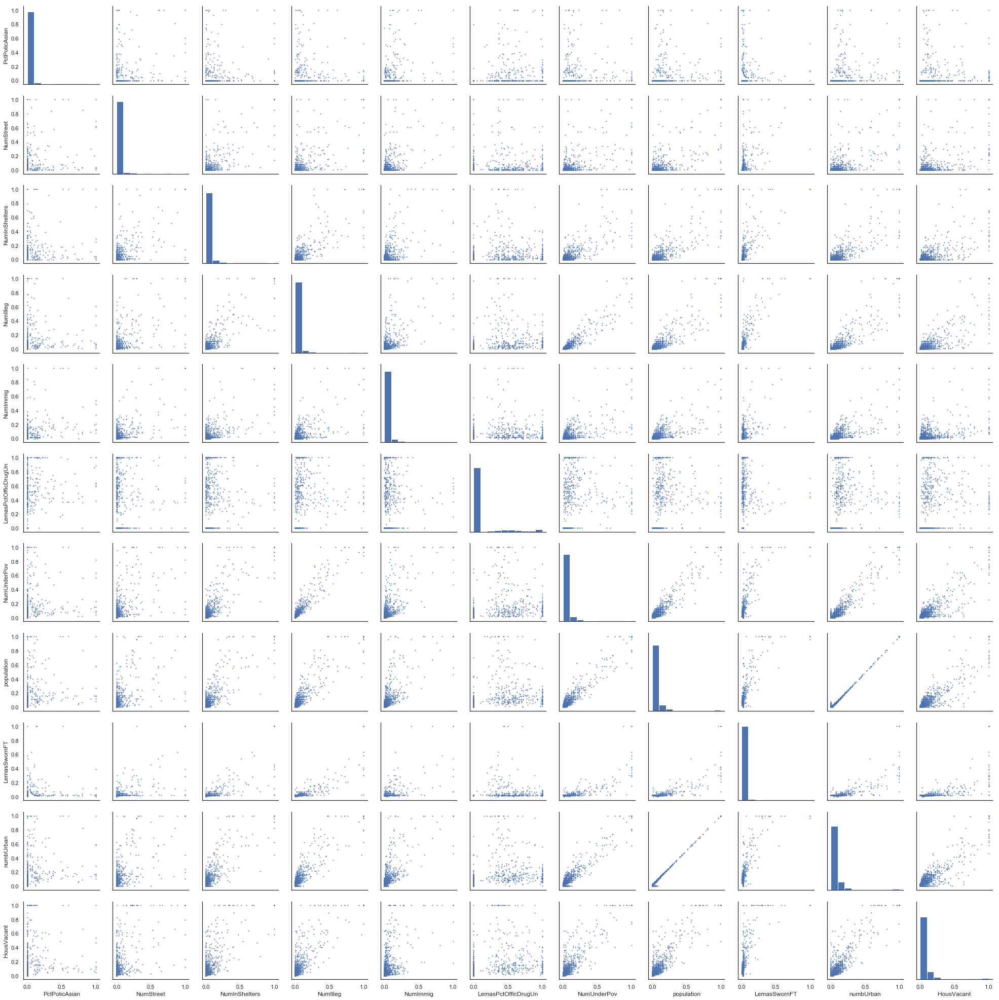

In [16]:
# make scatter plots
g = sns.PairGrid(communities_X[CV_highest.index])
g = g.map_diag(plt.hist)
g = g.map_offdiag(plt.scatter, s = 1)

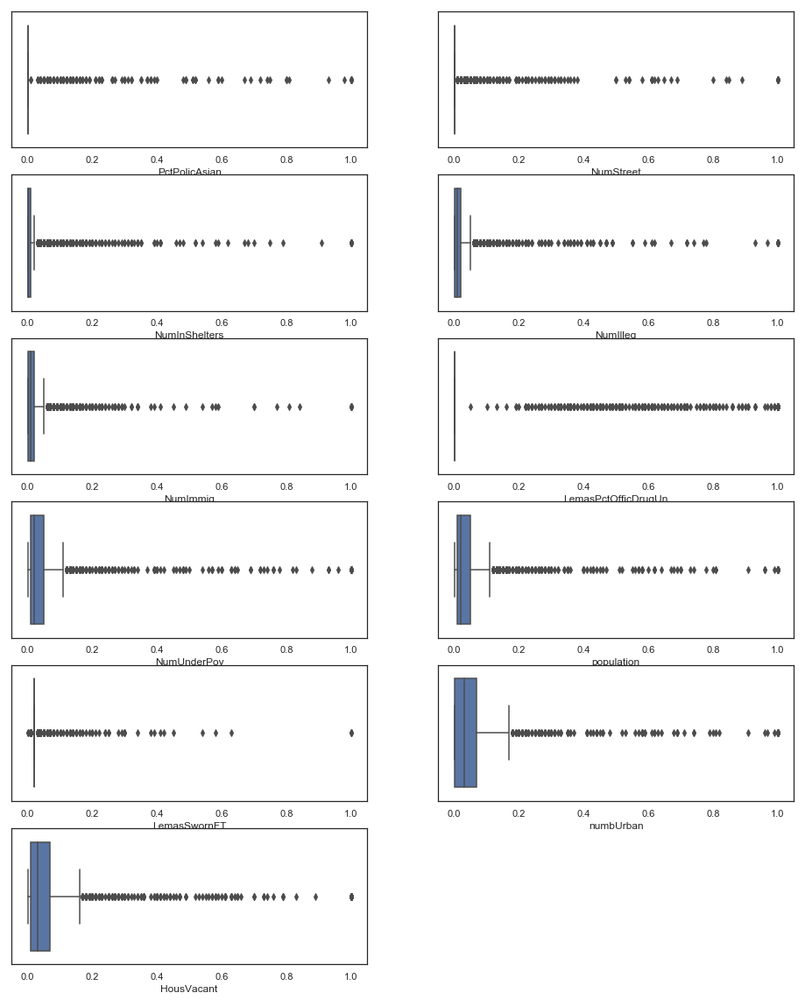

In [17]:
# make box plots
f = plt.figure(figsize=(16,20))
for i, j in enumerate(CV_highest.index):
    ax = f.add_subplot(6, 2, i + 1)
    sns.boxplot(x = communities_X[j])

I can't draw conclusions about significance of those features, just by the scatter plots.

## (f) A linear model using least squares

In [18]:
# train a full linear regression model
model_linear = LinearRegression().fit(communities_train_X, communities_train_Y)
# calculate R^2 of the model using test data
test_error_linear = 1- model_linear.score(communities_test_X[:100], communities_test_Y[:100])
print('The test error of this linear regression is', str(test_error_linear) + '.')


The test error of this linear regression is 0.377775509455758.


## (g) A ridge regression model 

In [19]:
from sklearn.linear_model import RidgeCV
# train a ridge regression model with built-in cross-validation
model_ridge = RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1]).fit(communities_train_X, communities_train_Y)
# calculate λ
lamda_r = model_ridge.alpha_
# calculate R^2 of the model using test data
test_error_ridge = 1 - model_ridge.score(communities_test_X, communities_test_Y)
print('The test error of this ridge regression is', str(test_error_ridge) + '.')
print('We chose', lamda_r, 'as λ.')

The test error of this ridge regression is 0.37068939721453875.
We chose 1.0 as λ.


## (h) LASSO models

### Normalized data

In [20]:
warnings.filterwarnings('ignore')
from sklearn.linear_model import LassoCV
# train a LASSO regression model with built-in cross-validation using this normalized dataset
model_LASSO = LassoCV(cv = 5, random_state = 0).fit(communities_train_X, communities_train_Y) 
# calculate λ
lamda_l = model_LASSO.alpha_
# calculate R^2 of the model using test data
test_error_LASSO = 1 - model_LASSO.score(communities_test_X, communities_test_Y)
print('The test error of this LASSO regression is', str(test_error_LASSO) + '.')
print('We chose', lamda_l, 'as λ.')


The test error of this LASSO regression is 0.37046891417972194.
We chose 0.00012454087437758504 as λ.


### Standardized data

In [21]:
# standardize features

from sklearn.preprocessing import StandardScaler

communities_train_X_standardized = pd.DataFrame(data = StandardScaler().fit_transform(communities_train_X), columns = attributes[5:-1])
communities_test_X_standardized = pd.DataFrame(data = StandardScaler().fit_transform(communities_test_X), columns = attributes[5:-1])


In [22]:
warnings.filterwarnings('ignore')
# train a LASSO regression model with built-in cross-validation using this normalized dataset
model_LASSO = LassoCV(cv = 5, random_state = 0).fit(communities_train_X_standardized, communities_train_Y) 
# calculate λ
lamda_l = model_LASSO.alpha_
# calculate R^2 of the model using test data
test_error_LASSO = 1 - model_LASSO.score(communities_test_X_standardized, communities_test_Y)
print('The test error of this LASSO regression is', str(test_error_LASSO) + '.')
print('We chose', lamda_l, 'as λ.')


The test error of this LASSO regression is 0.3757907001531139.
We chose 0.0007630833878262516 as λ.


### Compare
As is shown above, the test error of LASSO model based on normalized features is slightly smaller than that based on standardized features.

## (i) A PCR model

In [23]:
# compute cross-validation scores for each M
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
cross_validation_scores_pcr = []
m_range = range(1,123)
for i in m_range:
    pca = PCA(n_components = i)
    pca_trained = pca.fit(communities_train_X_standardized)
    communities_train_X_standardized_reduced = pca_trained.transform(communities_train_X_standardized)
    # compute model using this dimention-reduced dataset
    model_PCR = LinearRegression()
    cross_validation_score = np.mean(cross_val_score(model_PCR, communities_train_X_standardized_reduced, communities_train_Y, cv = 5))
    cross_validation_scores_pcr.append(cross_validation_score)


In [24]:
# choose the best M by cross-validation
M = m_range[np.argmax(cross_validation_scores_pcr)]
print('The best M (the number of principal components) chosen by cross-validation is', str(M) + '.')


The best M (the number of principal components) chosen by cross-validation is 95.


In [25]:
from sklearn.decomposition import PCA

# reduce X by PCA
pca = PCA(n_components = M)
pca_trained = pca.fit(communities_train_X_standardized)
communities_train_X_standardized_reduced = pca_trained.transform(communities_train_X_standardized)
communities_test_X_standardized_reduced = pca_trained.transform(communities_test_X_standardized)

# compute model using this dimention-reduced dataset
model_PCR = LinearRegression().fit(communities_train_X_standardized_reduced, communities_train_Y)
# calculate R^2 of the model using test data
test_error_PCR = 1 - model_PCR.score(communities_test_X_standardized_reduced, communities_test_Y)
print('The test error of this PCR is', str(test_error_PCR) + '.')


The test error of this PCR is 0.39086518461541153.


## (j) A boosting tree

In [26]:
warnings.filterwarnings('ignore')
from xgboost import XGBRegressor
# train a boosting tree regression
cross_validation_scores_boost = []
alpha_range = np.float_power(10,np.arange(-3, 3, 1))
# create models with different alpha
for i in alpha_range:
    model_boost = XGBRegressor(reg_alpha = i, n_estimators = 100)
    #model_boost = xgb.fit(communities_train_X_standardized, communities_test_Y)
    cross_validation_score = np.mean(cross_val_score(model_boost, communities_train_X_standardized, communities_train_Y, cv = 5))
    cross_validation_scores_boost.append(cross_validation_score)
cross_validation_scores_boost

# determine the regularization term α by cross-validation
alpha = alpha_range[np.argmax(cross_validation_scores_boost)]
print('The best alpha (the regularization term) chosen by cross-validation is', str(alpha) + '.')


The best alpha (the regularization term) chosen by cross-validation is 1.0.


# 2. Tree-Based Methods

## (b) Data Preparation

### i. Research

According to the research, we can use mean, median, and other statistics of the dataset to impute missing values.

In [9]:
# import data
failure_train_raw = pd.read_csv('./2Tree-Based Methods/aps_failure_training_set.arff')
failure_test_raw = pd.read_csv('./2Tree-Based Methods/aps_failure_test_set.arff')

# split them into Xs and Ys 
failure_train_X_raw = failure_train_raw.iloc[:, 1:]
failure_test_X_raw = failure_test_raw.iloc[:, 1:]

failure_train_Y = failure_train_raw['class'].to_frame()
failure_test_Y = failure_test_raw['class'].to_frame()

# data imputation by mean
failure_train_X_raw = failure_train_X_raw.replace('na', np.nan)
failure_test_X_raw = failure_test_X_raw.replace('na', np.nan)
imp_failure = SimpleImputer(missing_values=np.nan, strategy='mean')
imp_failure.fit(failure_train_X_raw)

# attribute names
attributes_failure_features = list(failure_train_raw.columns[1:])  # <=> list(failure_train)[1:]
attributes_failure_label = [failure_train_raw.columns[0]]
# fit the data imputed into dataframes
failure_train_X = pd.DataFrame(data = imp_failure.transform(failure_train_X_raw), columns = attributes_failure_features)
failure_test_X = pd.DataFrame(data = imp_failure.transform(failure_test_X_raw), columns = attributes_failure_features)

# concat imputed X, Y
failure_train = pd.concat([failure_train_X, failure_train_Y], axis=1)
failure_test = pd.concat([failure_test_X, failure_test_Y], axis=1)


In [25]:
# export processed data
failure_train.to_csv(path_or_buf = './2Tree-Based Methods/aps_failure_train_weka.csv', index=False)
failure_test.to_csv(path_or_buf = './2Tree-Based Methods/aps_failure_test_weka.csv', index=False)


### ii. coefficient of variation CV

In [10]:
CV = variation(failure_train_X).tolist()
for i, j in zip(attributes_failure_features, CV):
        print('The Coefficient of Variation (CV) for', i, 'is', j, '.')


The Coefficient of Variation (CV) for aa_000 is 2.4509171533790517 .
The Coefficient of Variation (CV) for ab_000 is 2.3283805836167146 .
The Coefficient of Variation (CV) for ac_000 is 2.169748441813564 .
The Coefficient of Variation (CV) for ad_000 is 183.84608829915004 .
The Coefficient of Variation (CV) for ae_000 is 23.190743406979212 .
The Coefficient of Variation (CV) for af_000 is 18.658765604354603 .
The Coefficient of Variation (CV) for ag_000 is 91.87779897140425 .
The Coefficient of Variation (CV) for ag_001 is 34.85465961859649 .
The Coefficient of Variation (CV) for ag_002 is 17.368998661426197 .
The Coefficient of Variation (CV) for ag_003 is 8.549977776004786 .
The Coefficient of Variation (CV) for ag_004 is 5.401433682911924 .
The Coefficient of Variation (CV) for ag_005 is 2.927067689890113 .
The Coefficient of Variation (CV) for ag_006 is 2.3449075291972994 .
The Coefficient of Variation (CV) for ag_007 is 2.8334604784703683 .
The Coefficient of Variation (CV) for ag

### iii. A correlation matrix

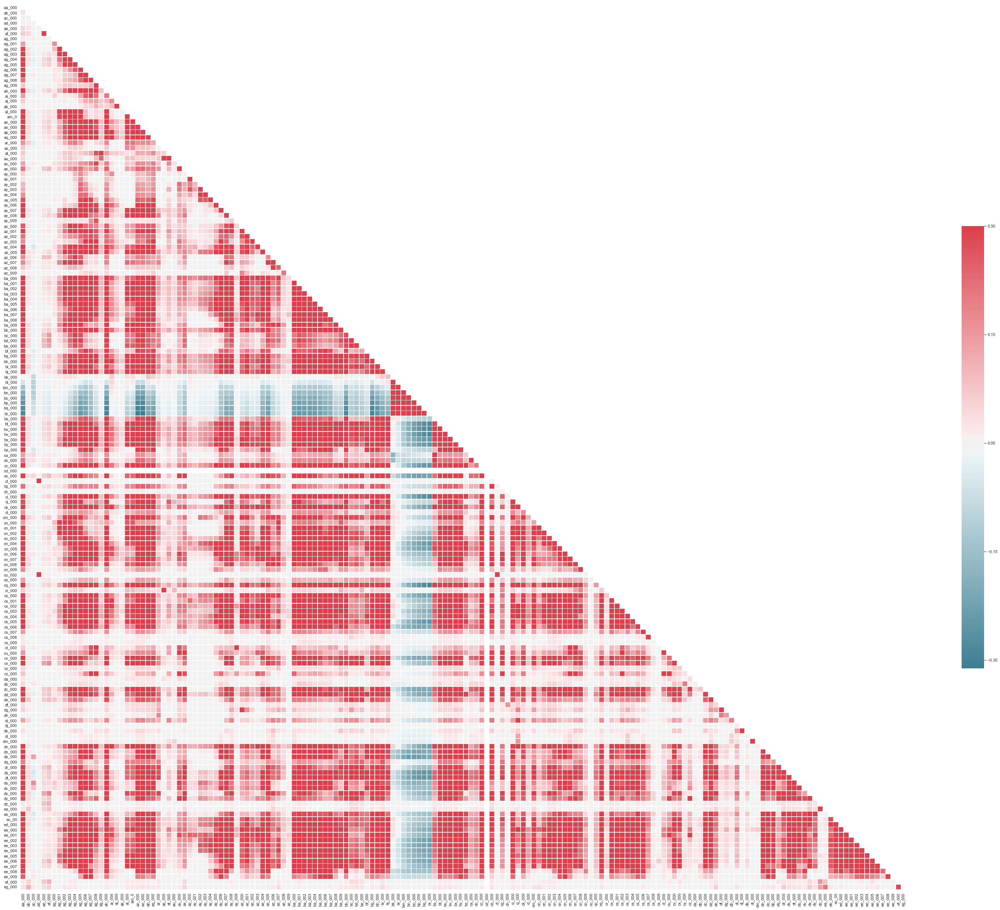

In [11]:
# Compute the correlation matrix
corr_failure = failure_train_X.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr_failure, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(55, 45))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_failure, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [12]:
corr_failure.style.background_gradient()

/Users/shengjiawu/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:512: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


### iv. Features with highest CV

In [14]:
# create CV dataframe
CV = pd.DataFrame(data = CV, columns = ['CV'], index = attributes_failure_features)
# sort CVs from highest to lowest
CV_sort = CV.sort_values(by = 'CV', ascending=False)
# pick top sqrt(170) features
CV_highest = CV_sort[0:int(round(np.sqrt(170)))]
CV_highest

,CV
cs_009,235.275644
cf_000,184.231557
co_000,183.947485
ad_000,183.846088
dh_000,114.984033
dj_000,109.646371
ag_000,91.877799
as_000,86.416184
ay_009,83.785365
az_009,76.967337


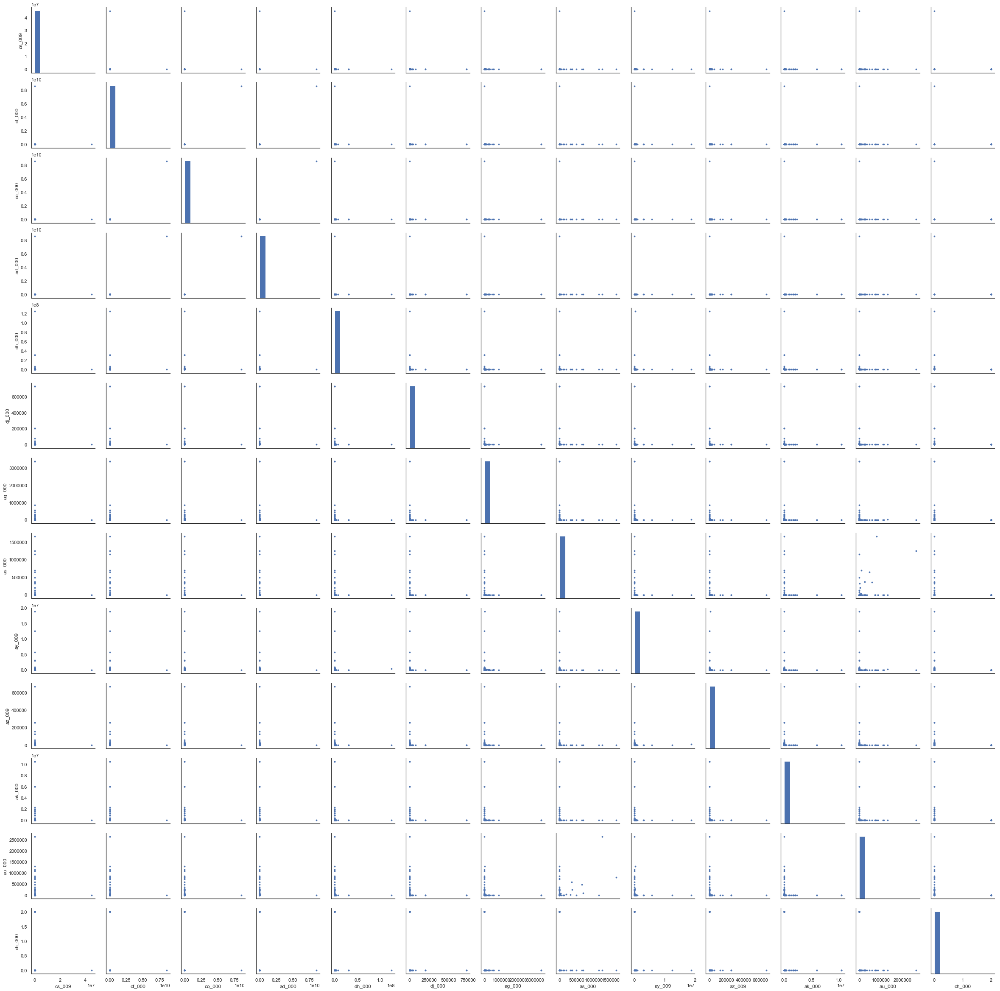

In [18]:
# make scatter plots
g = sns.PairGrid(failure_train_X[CV_highest.index])
g = g.map_diag(plt.hist)
g = g.map_offdiag(plt.scatter, s = 8)

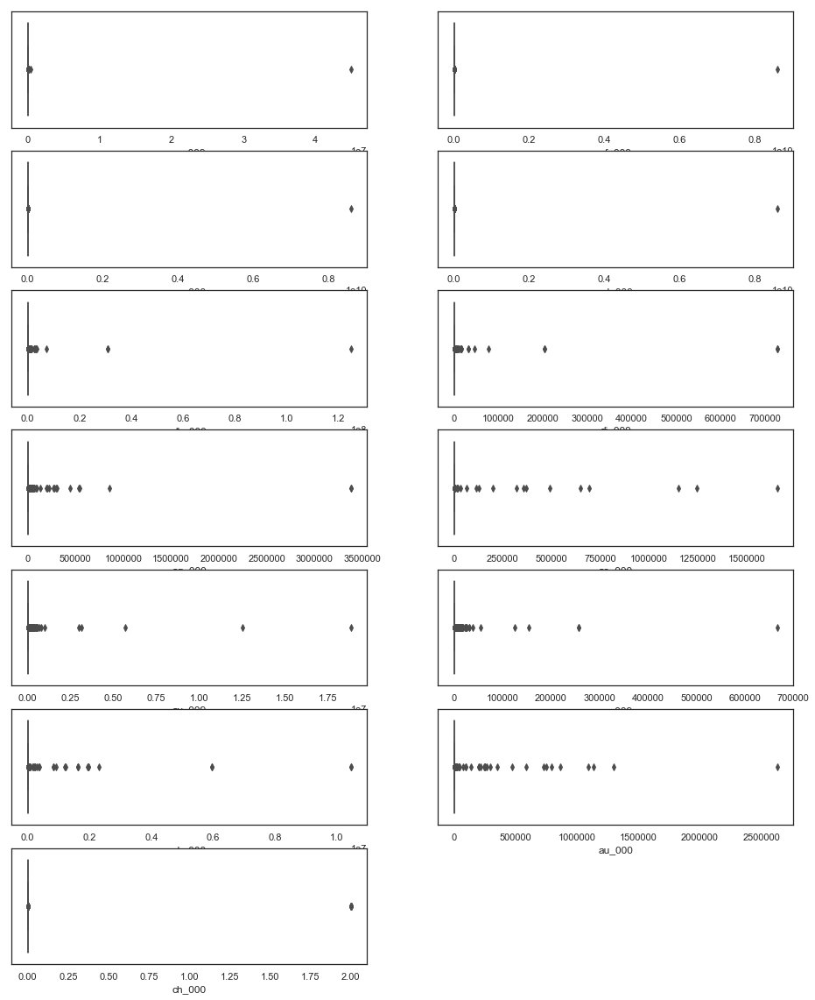

In [19]:
# make box plots
f = plt.figure(figsize=(16,20))
for i, j in enumerate(CV_highest.index):
    ax = f.add_subplot(7, 2, i + 1)
    sns.boxplot(x = failure_train_X[j])

I can't draw conclusions about significance of those features, just by the scatter plots

### v. Dataset

In [34]:
num_pos = failure_train[failure_train['class'] == 'pos'].shape[0]
num_neg = failure_train[failure_train['class'] == 'neg'].shape[0]

print('The number of positive data is', str(num_pos)+',\n',
      'and the number of negtive data is', str(num_neg)+'.')

The number of positive data is 1000,
 and the number of negtive data is 59000.


In [36]:
print('The number of negtive data is', int(num_neg/num_pos), 'times of positive data.')


The number of negtive data is 59 times of positive data.


This data set is obviously imbanlanced.

## (c) A random forest with uncompensated data

In [86]:
warnings.filterwarnings('ignore')
from sklearn.ensemble import RandomForestClassifier

clf = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0, oob_score=True)
clf.fit(failure_train_X, failure_train_Y)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=True, random_state=0, verbose=0, warm_start=False)

In [87]:
failure_test_Y_pred = clf.predict(failure_test_X)
failure_test_Y_score = clf.score(failure_test_X, failure_test_Y)
failure_test_Y_proba = clf.predict_proba(failure_test_X)
failure_oob_error = 1 - clf.oob_score_
failure_test_error = 1 - failure_test_Y_score


The confusion matrix of this random forest classifier is
 [[15624     1]
 [  304    71]] 

The ROC of this random forest classifier is


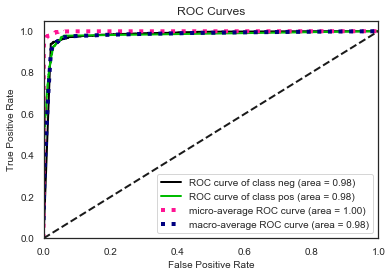

The AUC of this random forest classifier is already in the plot above. 
See ROC curve of class.

The Out of Bag error of this random forest classifier is
 0.014100000000000001 

The test error of this random forest classifier is
 0.019062499999999982


In [88]:

import matplotlib.pyplot as plt
import scikitplot as skplt
from sklearn.metrics import confusion_matrix

print('The confusion matrix of this random forest classifier is\n',
      confusion_matrix(failure_test_Y, failure_test_Y_pred),'\n')

print('The ROC of this random forest classifier is')
skplt.metrics.plot_roc(failure_test_Y, failure_test_Y_proba)
plt.show()

print('The AUC of this random forest classifier is already in the plot above.','\n'
        'See ROC curve of class.\n')

#from sklearn.metrics import roc_auc_score
#roc_auc_score(failure_test_Y, failure_test_Y_score)
print('The Out of Bag error of this random forest classifier is\n',
      failure_oob_error, '\n')

print('The test error of this random forest classifier is\n',
      failure_test_error)


* Misclassification
From the confusion matrix, misclassification number of negative class is 1, misclassification number of positive class is 304.

We see that in this case, the out of bag error is slightly smaller than the test error.

## (d) A random forest with compensated data

How class imbalance is addressed in random forests?

There are two approaches to solve the imbalance class problem.
One is the cost-sensitive approach which assigns different weights to class so that class can be balanced.
The other is resampling, such as oversampling the minority class or undersampling the majority class, SMOTE is one of that.

In [89]:
warnings.filterwarnings('ignore')
clf_cps = RandomForestClassifier(n_estimators=100, random_state=0, n_jobs=-1, oob_score=True, class_weight="balanced")

clf_cps.fit(failure_train_X, failure_train_Y)


RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=100, n_jobs=-1, oob_score=True, random_state=0,
            verbose=0, warm_start=False)

In [90]:
failure_test_Y_pred_cps = clf_cps.predict(failure_test_X)
failure_test_Y_score_cps = clf_cps.score(failure_test_X, failure_test_Y)
failure_test_Y_proba_cps = clf_cps.predict_proba(failure_test_X)
failure_oob_error_cps = 1 - clf_cps.oob_score_
failure_test_error_cps = 1 - failure_test_Y_score_cps

The confusion matrix of this random forest classifier is
 [[15610    15]
 [  170   205]] 

The ROC of this random forest classifier is


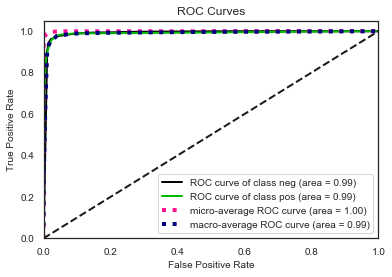

The AUC of this random forest classifier is already in the plot above. 
See ROC curve of class.

The Out of Bag error of this random forest classifier is
 0.007900000000000018 

The test error of this random forest classifier is
 0.011562500000000031


In [91]:
print('The confusion matrix of this random forest classifier is\n',
      confusion_matrix(failure_test_Y, failure_test_Y_pred_cps),'\n')

print('The ROC of this random forest classifier is')
skplt.metrics.plot_roc(failure_test_Y, failure_test_Y_proba_cps)
plt.show()

print('The AUC of this random forest classifier is already in the plot above.','\n'
        'See ROC curve of class.\n')

#from sklearn.metrics import roc_auc_score
#roc_auc_score(failure_test_Y, failure_test_Y_score)
print('The Out of Bag error of this random forest classifier is\n',
      failure_oob_error_cps, '\n')

print('The test error of this random forest classifier is\n',
      failure_test_error_cps)

* Misclassification
From the confusion matrix, misclassification number of negative class is 15, misclassification number of positive class is 170.

We see that in this case, the out of bag error is smaller than the test error.

Compare these results of random forest classifications with imbalance classes in 2(c) and balance classes, we see that balance data's overall performance of test set is better than that of imbalanced data. The prediction of positive class is better in balanced dataset.

****************************** (e) is in the other ipython file *********************

## (f) SMOTE pre-process

In [92]:
warnings.filterwarnings('ignore')
from imblearn.over_sampling import SMOTE
sm = SMOTE()
failure_train_X_cps, failure_train_Y_cps = sm.fit_resample(failure_train_X, failure_train_Y)
# fit compensated X, Y from arrays to dataframes
failure_train_X_cps = pd.DataFrame(data = failure_train_X_cps, columns = attributes_failure_features)
failure_train_Y_cps = pd.DataFrame(data = failure_train_Y_cps, columns = attributes_failure_label)
# concat compensated X, Y
failure_train_cps = pd.concat([failure_train_X_cps, failure_train_Y_cps], axis = 1)
# export processed data
failure_train_cps.to_csv(path_or_buf = './2Tree-Based Methods/aps_failure_train_cps_weka.csv', index=False)


************************** the rest of (f) is in the other ipython file *****************************